In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
from wordcloud import WordCloud
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from collections import Counter
from nltk import ngrams
from nltk import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer

In [2]:
df = pd.read_csv(r'E:\CV files\report.csv')

In [3]:
df.head(2)

,Average_Score,Hotel_Name,Reviewer_Nationality,Total_Number_of_Reviews,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,negative_review,positive,guests,with_a_pet,trip_type,stayed,type_of_Room,submit_from_mobile,Country_of_Hotel,year_of_reveiew_Date,month_of_reveiew_Date,day_of_reveiew_Date,Region_of_Reviewer,Tourist
0,7.7,Hotel Arena,Ireland,1403,7,7.5,negative,real complaint hotel great great location surr...,Couple,0,1.0,4,Duplex Double Room,0,Netherlands,2017,8,3,Europe,1
1,7.7,Hotel Arena,Australia,1403,9,7.1,room nice elderly bit difficult room two story...,location good staff ok cute hotel breakfast ra...,Family with young children,0,1.0,3,Duplex Double Room,1,Netherlands,2017,7,31,Oceania,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 491260 entries, 0 to 491259
Data columns (total 20 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Average_Score                               491260 non-null  float64
 1   Hotel_Name                                  491260 non-null  object 
 2   Reviewer_Nationality                        490773 non-null  object 
 3   Total_Number_of_Reviews                     491260 non-null  int64  
 4   Total_Number_of_Reviews_Reviewer_Has_Given  491260 non-null  int64  
 5   Reviewer_Score                              491260 non-null  float64
 6   negative_review                             489985 non-null  object 
 7   positive                                    490615 non-null  object 
 8   guests                                      491260 non-null  object 
 9   with_a_pet                                  491260 non-null  int64  
 

In [5]:
df.dropna(inplace=True,axis=0)

# 1- what is the best Hotel in each country for staying?

In [6]:
best_hotel=df[['Reviewer_Score','Hotel_Name','Country_of_Hotel']]
x =  best_hotel.groupby(['Country_of_Hotel','Hotel_Name'])['Reviewer_Score'].agg(["mean","count"]).reset_index().sort_values(by=["Country_of_Hotel","mean"],ascending=[False,False])
x

,Country_of_Hotel,Hotel_Name,mean,count
1084,United Kingdom,41,9.708824,102
1441,United Kingdom,The Soho Hotel,9.605769,156
1364,United Kingdom,Taj 51 Buckingham Gate Suites and Residences,9.595455,132
1194,United Kingdom,Haymarket Hotel,9.590909,121
1085,United Kingdom,45 Park Lane Dorchester Collection,9.588889,27
...,...,...,...,...
78,Austria,Hotel Gallitzinberg,7.875000,8
107,Austria,Hotel Vienna,7.869048,126
30,Austria,City Rooms,7.788095,42
26,Austria,Best Western Hotel Pension Arenberg Wien Zentrum,7.778771,179


In [7]:
x_best=x[(x["count"]>500) & (x["mean"]>8.3)]
x_best

,Country_of_Hotel,Hotel_Name,mean,count
1235,United Kingdom,Intercontinental London The O2,9.471327,2532
1090,United Kingdom,Amba Hotel Charing Cross,9.404220,782
1344,United Kingdom,Shangri La Hotel at The Shard London,9.385392,1109
1440,United Kingdom,The Savoy,9.350649,539
1406,United Kingdom,The Langham London,9.339122,547
...,...,...,...,...
77,Austria,Hotel Erzherzog Rainer,8.847029,589
71,Austria,Hotel City Central,8.762909,550
110,Austria,Hotel de France Wien,8.728587,920
18,Austria,Austria Trend Hotel Europa Wien,8.701919,521


In [8]:
x3=x_best.groupby(['Country_of_Hotel']).head(2) # to get 3 country

In [9]:
x_final = x3.sort_values(by=["Country_of_Hotel","count"],ascending=[False,False])
x_final

,Country_of_Hotel,Hotel_Name,mean,count
1235,United Kingdom,Intercontinental London The O2,9.471327,2532
1090,United Kingdom,Amba Hotel Charing Cross,9.404220,782
1036,Spain,Olivia Plaza Hotel,9.395969,769
1035,Spain,Olivia Balmes Hotel,9.435375,506
816,Netherlands,Hotel Esther a,9.310335,1819
774,Netherlands,Ambassade Hotel,9.386885,549
661,Italy,Hotel Berna,9.363838,1037
741,Italy,Room Mate Giulia,9.434893,513
559,France,Pullman Paris Tour Eiffel,8.745665,819
539,France,Novotel Paris Gare De Lyon,8.507401,554


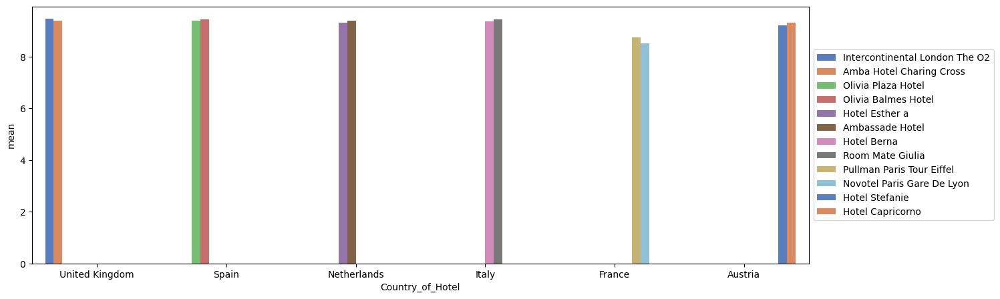

In [10]:
plt.figure(figsize=(15,5))
colors = sns.color_palette("muted")
sns.barplot(x='Country_of_Hotel', y='mean', hue='Hotel_Name', data=x_final,palette=colors)
plt.legend(loc='center left',bbox_to_anchor=(1, 0.5))
plt.show()

The best 3 hotels in each country were selected based on the guests’ reviews and according to the number of guests for the same hotel in the data. We did not rely on the average score because it is better to rely on the guests in the data who reviewed.

In [11]:
# fig=px.bar(data_frame=x_final,x='Country_of_Hotel',y='mean',color='Hotel_Name')
# fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})

# the worst hotel

In [12]:
worst_hotel=df[['Reviewer_Score','Hotel_Name','Country_of_Hotel']]
x_worest =  worst_hotel.groupby(['Country_of_Hotel','Hotel_Name'])['Reviewer_Score'].agg(["mean","count"]).reset_index().sort_values(by=["Country_of_Hotel","mean"],ascending=[True,True])
x_worest

,Country_of_Hotel,Hotel_Name,mean,count
76,Austria,Hotel Eitlj rg,7.750000,12
26,Austria,Best Western Hotel Pension Arenberg Wien Zentrum,7.778771,179
30,Austria,City Rooms,7.788095,42
107,Austria,Hotel Vienna,7.869048,126
78,Austria,Hotel Gallitzinberg,7.875000,8
...,...,...,...,...
1085,United Kingdom,45 Park Lane Dorchester Collection,9.588889,27
1194,United Kingdom,Haymarket Hotel,9.590909,121
1364,United Kingdom,Taj 51 Buckingham Gate Suites and Residences,9.595455,132
1441,United Kingdom,The Soho Hotel,9.605769,156


In [13]:
x_worest['mean'].min()

6.871428571428572

In [14]:
x_w=x_worest.groupby(['Country_of_Hotel']).head(2) # to get 3 country
x_w

,Country_of_Hotel,Hotel_Name,mean,count
76,Austria,Hotel Eitlj rg,7.750000,12
26,Austria,Best Western Hotel Pension Arenberg Wien Zentrum,7.778771,179
427,France,Kube Hotel Ice Bar,6.871429,14
601,France,Villa Alessandra,7.196000,25
617,Italy,Admiral Hotel,7.316000,25
722,Italy,Mokinba Hotels King,7.437313,134
857,Netherlands,Royal Amsterdam Hotel,7.672078,154
781,Netherlands,Best Western Blue Tower Hotel,7.682794,773
1045,Spain,Renaissance Barcelona Hotel,7.380000,30
1008,Spain,Ilunion Almirante,7.443590,234


In [15]:
x_final_w = x_w.sort_values(by=["Country_of_Hotel","count"],ascending=[False,False])
x_final_w

,Country_of_Hotel,Hotel_Name,mean,count
1115,United Kingdom,Britannia International Hotel Canary Wharf,7.397394,4067
1101,United Kingdom,BEST WESTERN Maitrise Hotel Maida Vale,7.308183,721
1008,Spain,Ilunion Almirante,7.443590,234
1045,Spain,Renaissance Barcelona Hotel,7.380000,30
781,Netherlands,Best Western Blue Tower Hotel,7.682794,773
857,Netherlands,Royal Amsterdam Hotel,7.672078,154
722,Italy,Mokinba Hotels King,7.437313,134
617,Italy,Admiral Hotel,7.316000,25
601,France,Villa Alessandra,7.196000,25
427,France,Kube Hotel Ice Bar,6.871429,14


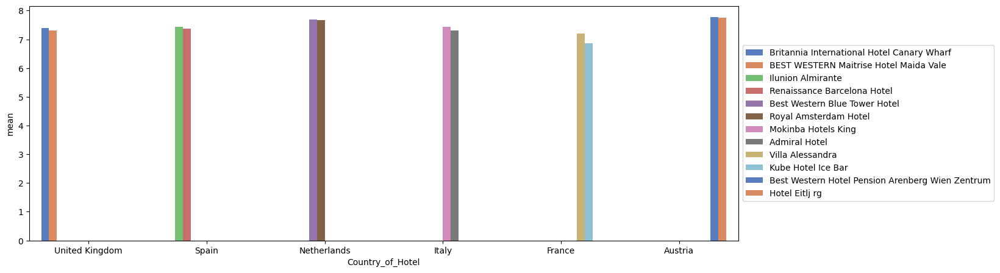

In [16]:
plt.figure(figsize=(15,5))
colors = sns.color_palette("muted")
sns.barplot(x='Country_of_Hotel', y='mean', hue='Hotel_Name', data=x_final_w,palette=colors)
plt.legend(loc='center left',bbox_to_anchor=(1, 0.5))
plt.show()

In [17]:
# plotly chart
# figs=px.bar(data_frame=x_final_w,x='Country_of_Hotel',y='mean',color='Hotel_Name')
# figs.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})

# 2- What are the best destination and best hotels for Arab guests, and what were their reviews?

In [18]:
arab_guest=df[['Reviewer_Score','Region_of_Reviewer','Reviewer_Nationality','Hotel_Name','Country_of_Hotel','negative_review','positive','type_of_Room','guests','stayed']]
arab_guest.head(3)

,Reviewer_Score,Region_of_Reviewer,Reviewer_Nationality,Hotel_Name,Country_of_Hotel,negative_review,positive,type_of_Room,guests,stayed
0,7.5,Europe,Ireland,Hotel Arena,Netherlands,negative,real complaint hotel great great location surr...,Duplex Double Room,Couple,4
1,7.1,Oceania,Australia,Hotel Arena,Netherlands,room nice elderly bit difficult room two story...,location good staff ok cute hotel breakfast ra...,Duplex Double Room,Family with young children,3
2,6.7,Oceania,New Zealand,Hotel Arena,Netherlands,booked company line showed picture room though...,amazing location building romantic setting,Suite,Couple,2


In [19]:
arab_guest.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 488933 entries, 0 to 491259
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Reviewer_Score        488933 non-null  float64
 1   Region_of_Reviewer    488933 non-null  object 
 2   Reviewer_Nationality  488933 non-null  object 
 3   Hotel_Name            488933 non-null  object 
 4   Country_of_Hotel      488933 non-null  object 
 5   negative_review       488933 non-null  object 
 6   positive              488933 non-null  object 
 7   type_of_Room          488933 non-null  object 
 8   guests                488933 non-null  object 
 9   stayed                488933 non-null  int64  
dtypes: float64(1), int64(1), object(8)
memory usage: 41.0+ MB


In [20]:
arab_guest=arab_guest[arab_guest['Region_of_Reviewer']=='Arabic_Region']
arab_guest.head()

,Reviewer_Score,Region_of_Reviewer,Reviewer_Nationality,Hotel_Name,Country_of_Hotel,negative_review,positive,type_of_Room,guests,stayed
42,5.4,Arabic_Region,United Arab Emirates,Hotel Arena,Netherlands,service horrible pillow super stiff big could ...,clean new,Large King Room,Couple,1
61,7.9,Arabic_Region,United Arab Emirates,Hotel Arena,Netherlands,bathroom amazing though two friend sharing gla...,beautiful design comfortable room friendly sta...,Duplex Twin Room,Couple,4
251,10.0,Arabic_Region,United Arab Emirates,Hotel Arena,Netherlands,negative,amazing view park busy area nice room,Duplex Double Room,Couple,2
410,8.3,Arabic_Region,Saudi Arabia,K K Hotel George,United Kingdom,breakfast everyday much option good clean fitn...,friendly stuff clean location,Classic Double Room,Solo traveler,5
436,8.3,Arabic_Region,Saudi Arabia,K K Hotel George,United Kingdom,room heated may issue cold winter gym open pm ...,location heated outdoor smoking area breakfast...,Classic Twin Room,Group,10


In [29]:
df1=arab_guest.groupby('Reviewer_Nationality')[['Reviewer_Score']].agg('count').sort_values(by='Reviewer_Score', ascending=False).reset_index().head(10)

In [30]:
df1

,Reviewer_Nationality,Reviewer_Score
0,United Arab Emirates,9392
1,Saudi Arabia,8247
2,Kuwait,4581
3,Qatar,2534
4,Egypt,2224
5,Lebanon,2095
6,Bahrain,1497
7,Oman,1241
8,Jordan,699
9,Iraq,258


In [35]:
# plotly chart
fig = px.bar(df1, y='Reviewer_Score', x='Reviewer_Nationality', text_auto='.2s',labels={'Reviewer_Nationality': 'Nationality', 'Reviewer_Score':'Count'},title="Nationalities of the Arab region by Count")
fig.show()

In [22]:
# the most arab make reviews united arab emirate then saudi the kuwait

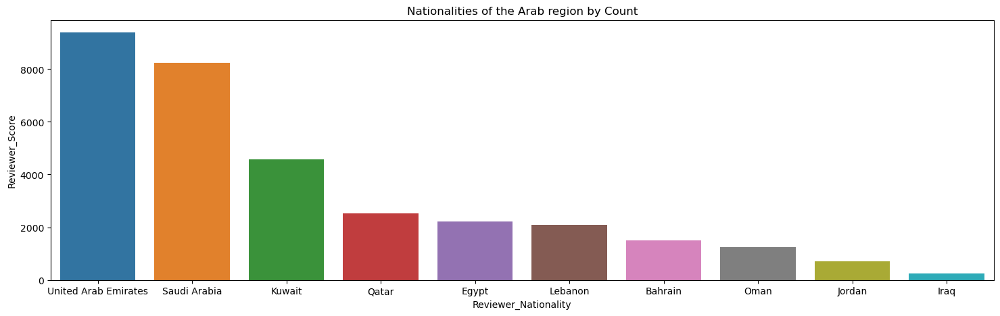

In [39]:
plt.figure(figsize=(18,5))
sns.barplot(y='Reviewer_Score', x='Reviewer_Nationality',data=df1)
plt.title('Nationalities of the Arab region by Count')
plt.show()

In [ ]:
# the most destinations from Arab were the United Kingdom, then France and Spain

In [32]:
df2=arab_guest.groupby('Country_of_Hotel')[['Reviewer_Score']].agg('count').sort_values(by='Reviewer_Score', ascending=False).reset_index().head(10)

In [34]:
# plotly chart
fig = px.bar(df2, y='Reviewer_Score', x='Country_of_Hotel', text_auto='.2s',labels={'Country_of_Hotel': 'Country_of_Hotel', 'Reviewer_Score':'Count'},title="Most destinations for Arab nationalities",color_discrete_sequence=["green"])
fig.show()

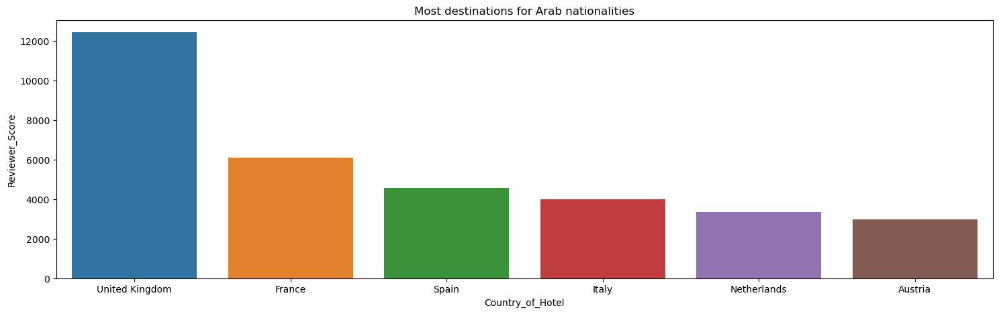

In [36]:
plt.figure(figsize=(18,5))
sns.barplot(y='Reviewer_Score', x='Country_of_Hotel',data=df2)
plt.title("Most destinations for Arab nationalities")
plt.show()

In [40]:
arab_guest.describe(include = "object")

,Region_of_Reviewer,Reviewer_Nationality,Hotel_Name,Country_of_Hotel,negative_review,positive,type_of_Room,guests
count,33349,33349,33349,33349,33349,33349,33349,33349
unique,1,20,1429,6,20081,22339,1348,6
top,Arabic_Region,United Arab Emirates,The Cumberland A Guoman Hotel,United Kingdom,negative,location,Superior Double Room,Couple
freq,33349,9392,515,12428,6573,2539,1912,9821


In [41]:
arab_guest.describe()

,Reviewer_Score,stayed
count,33349.000000,33349.000000
mean,8.220948,3.675822
std,1.510528,2.569370
min,4.400000,0.000000
25%,7.100000,2.000000
50%,8.300000,3.000000
75%,9.600000,5.000000
max,10.000000,31.000000


In [ ]:
#  Average number of nights stay 3 nights.

In [42]:
# nights distribution

<AxesSubplot:xlabel='stayed', ylabel='Count'>

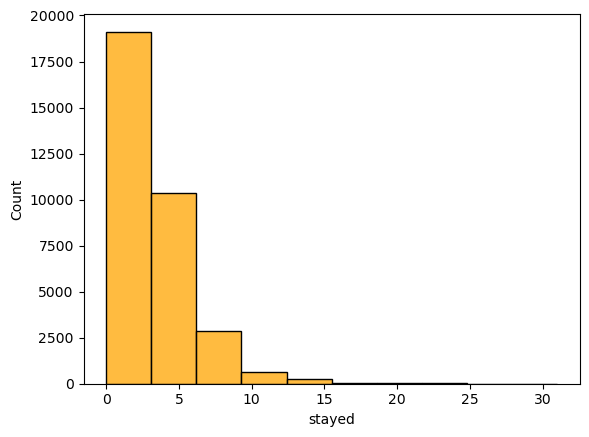

In [43]:
sns.histplot(arab_guest["stayed"],bins=10,color='orange')

In [44]:
# plotly chart
px.histogram(arab_guest, x="stayed", nbins=10,text_auto=True,title='nights Distribution ',)

In [ ]:
# Review_score Distribution

<AxesSubplot:xlabel='Reviewer_Score', ylabel='Count'>

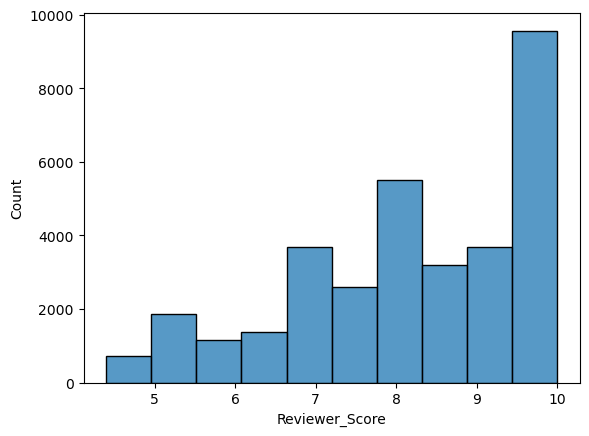

In [45]:
sns.histplot(arab_guest["Reviewer_Score"],bins=10)

In [46]:
# plotly chart
px.histogram(arab_guest, x="Reviewer_Score", nbins=10,text_auto=True,title='Reviewer_Score Distribution ',color_discrete_sequence=['indianred'] )

In [ ]:
# The majority of Arabs who come to any country

<Figure size 1200x800 with 0 Axes>

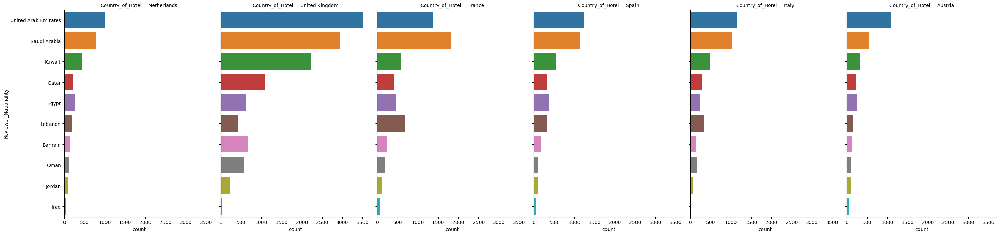

In [47]:
plt.figure(figsize=(12,8))
sns.catplot( y="Reviewer_Nationality",col="Country_of_Hotel", col_wrap=6,data=arab_guest, kind="count",height=7, aspect=.7,order = arab_guest['Reviewer_Nationality'].value_counts()[:10].index )

In [ ]:
# Positive Comment and Negative Comment for Arab 

In [48]:
all_neg_words=arab_guest['negative_review'].values
all_pos_words=arab_guest["positive"].values

In [49]:
cv = CountVectorizer(analyzer = 'word',stop_words = 'english',max_features = 50,ngram_range=(4,4))
most_negative_words = cv.fit_transform(all_neg_words)

In [50]:
#Finding most important words in Negative Reviews 
cv = CountVectorizer(analyzer = 'word',stop_words = 'english',max_features = 50,ngram_range=(4,4))
most_negative_words = cv.fit_transform(all_neg_words)
neg_counts = most_negative_words.sum(axis=0)
neg_counts = cv.vocabulary_
print('the most important words in Negative Reviews:')
print('--------------------------------------------')
print(neg_counts)

the most important words in Negative Reviews:
--------------------------------------------
{'breakfast included room rate': 2, 'room small bathroom tiny': 34, 'size room bit small': 41, 'little bit far center': 12, 'tea coffee making facility': 49, 'coffee making facility room': 3, 'small room small bed': 46, 'poor breakfast small room': 22, 'room small bathroom small': 33, 'room small bed comfortable': 35, 'room service clean room': 27, 'room service house keeping': 29, 'room small double room': 37, 'room little bit small': 26, 'room service close pm': 28, 'room change bed sheet': 25, 'price little bit high': 23, 'feel like star hotel': 7, 'small bathroom small room': 42, 'small room star hotel': 47, 'hotel far city center': 10, 'room small bed small': 36, 'small room small bathroom': 45, 'room size small bathroom': 31, 'location bit far city': 16, 'bit far city center': 1, 'room sound proof hear': 40, 'furniture little bit old': 8, 'small room bed comfortable': 43, 'room service menu

In [51]:
negative_words=pd.DataFrame()
negative_words["negative_sentence"]=neg_counts.keys()
negative_words["frequency"]=neg_counts.values()

In [52]:
negative_frequent = negative_words.sort_values(by="frequency",ascending=False)
negative_frequent.head()

,negative_sentence,frequency
4,tea coffee making facility,49
37,tea coffee facility room,48
19,small room star hotel,47
6,small room small bed,46
22,small room small bathroom,45


In [53]:
st_for_wc=["positive","no negative","nothing","none","everything","n a","n","na","not much",'no',"object", "dtype","Positive_Review","Negative_Review","Wa","negative",'super','two','name','st','though','although','available','angry','put','away',
           'cen','kept','also','con','like','se','great','excellent','good','fantastic']
stop_words = set(stopwords.words('english'))

In [54]:
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 200,
        max_font_size = 40, 
        scale = 3,
        random_state = 42,stopwords =list(stop_words)+st_for_wc).generate(str(data))

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()

In [55]:
# Negative Comment for Arab 

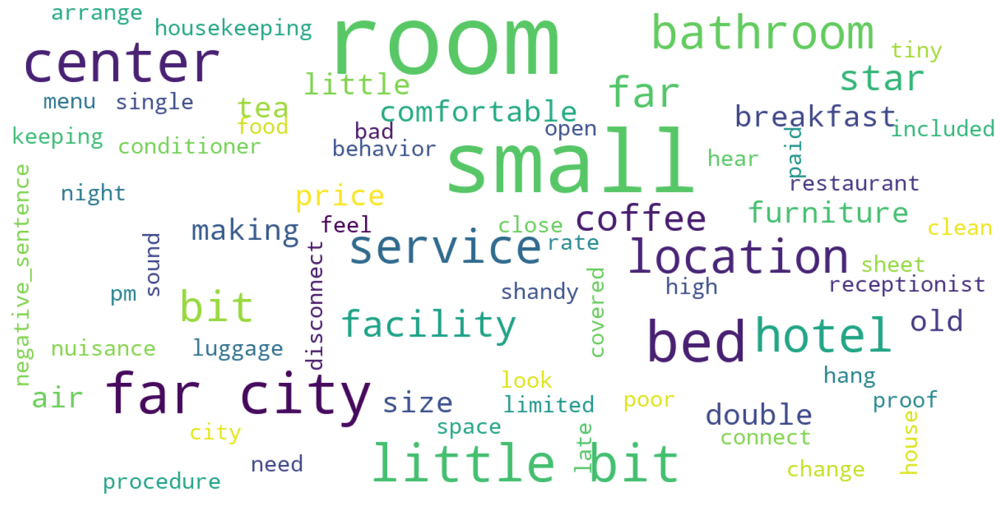

In [56]:
show_wordcloud(negative_frequent['negative_sentence'])

<AxesSubplot:xlabel='frequency', ylabel='negative_sentence'>

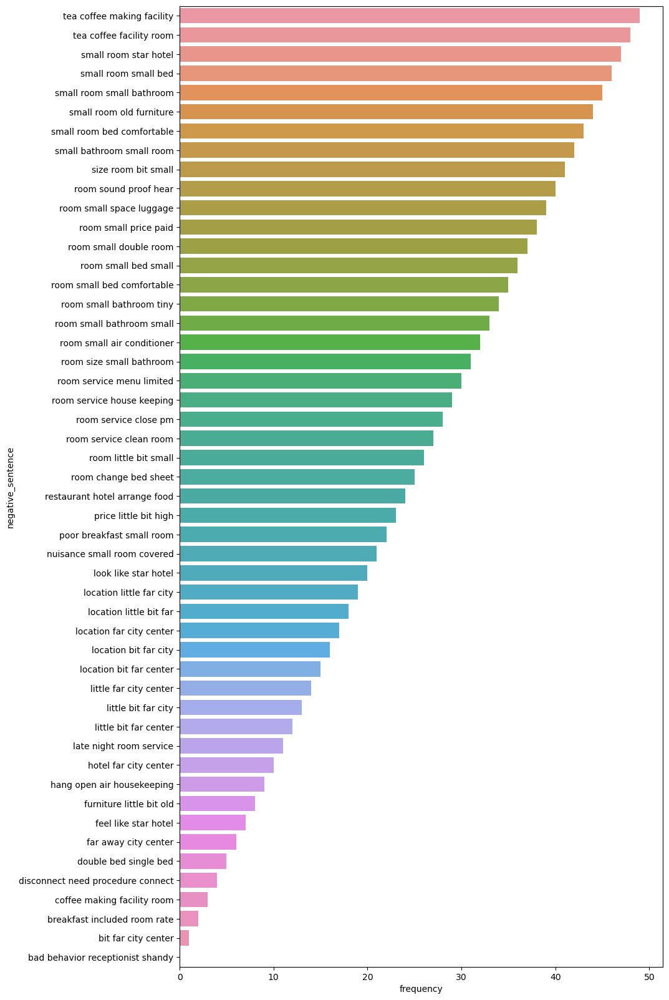

In [57]:
plt.figure(figsize=(10,20))
sns.barplot(x='frequency',y='negative_sentence',data=negative_frequent)

In [58]:
# observation 
# Coffe and Tea are important in room
# it seems the Rooms are small (bed and bathroom too)
# hotel Location far of city center
# it seems there is problem in breakfast
# it seems there is problem in air conditioner

In [59]:
cv = CountVectorizer(analyzer = 'word',stop_words = 'english',max_features = 50,ngram_range=(4,4))
most_positive_words = cv.fit_transform(all_pos_words)
pos_counts = most_positive_words.sum(axis=0)
pos_counts = cv.vocabulary_
print('the most important words in Positive Reviews:')
print('--------------------------------------------')
print(pos_counts)

the most important words in Positive Reviews:
--------------------------------------------
{'staff extremely friendly helpful': 41, 'good location friendly staff': 11, 'staff friendly room clean': 46, 'friendly staff good location': 9, 'excellent staff friendly helpful': 4, 'staff friendly helpful room': 43, 'friendly helpful room clean': 5, 'location staff friendly helpful': 35, 'good location helpful staff': 12, 'staff friendly location good': 44, 'perfect location friendly staff': 38, 'london eye big ben': 36, 'hyde park oxford street': 21, 'hotel staff friendly helpful': 20, 'great location friendly staff': 13, 'friendly helpful staff great': 6, 'helpful staff great location': 18, 'location excellent staff friendly': 23, 'location close metro station': 22, 'friendly staff clean room': 7, 'location friendly staff nice': 28, 'clean room comfortable bed': 0, 'friendly staff great location': 10, 'location good value money': 30, 'great location helpful staff': 15, 'minute walk metro sta

In [60]:
positive_words=pd.DataFrame()
positive_words["positive_sentence"]=pos_counts.keys()
positive_words["frequency"]=pos_counts.values()

In [61]:
postitve_frequent = positive_words.sort_values(by="frequency",ascending=False)

In [62]:
# Positive Comment for Arab 

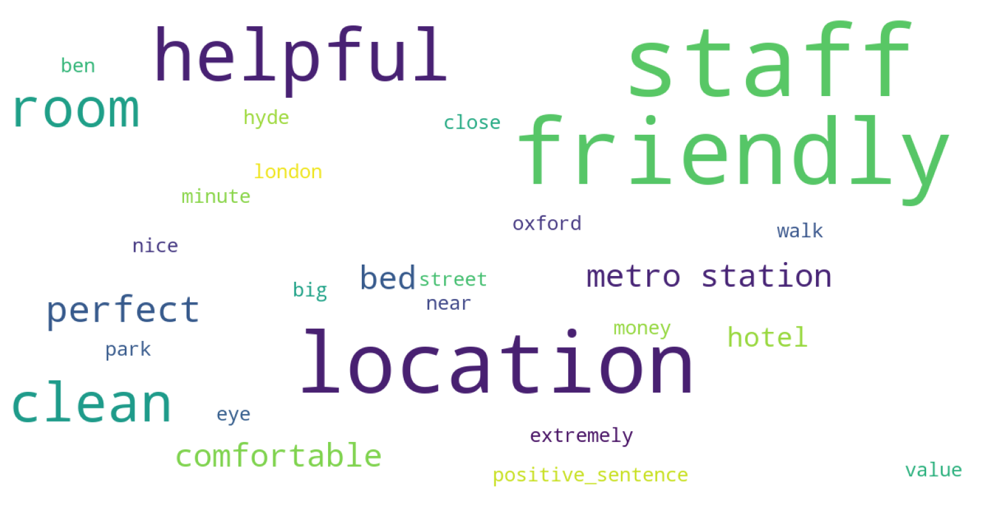

In [63]:
show_wordcloud(positive_words['positive_sentence'])

<AxesSubplot:xlabel='frequency', ylabel='positive_sentence'>

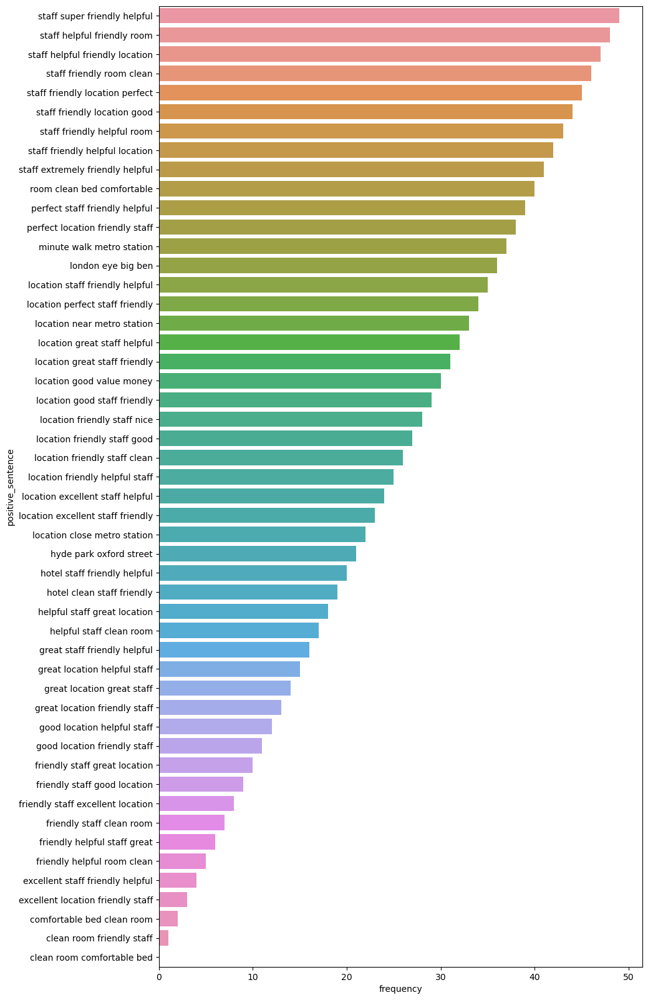

In [64]:
plt.figure(figsize=(10,20))
sns.barplot(x='frequency',y='positive_sentence',data=postitve_frequent)

In [ ]:
# observations:
# Staff helpful and friendly
# it seems the Rooms clean
# it seems the beds are comfortable
# some of hotel Location are great - good

What about the type of guests, whether single or couple, what are the most important points that make them happy with the experience, and also what are the most important requests of those who have pets

In [66]:
df3=arab_guest.groupby('guests')[['Reviewer_Score']].agg('count').sort_values(by='Reviewer_Score', ascending=False).reset_index().head(5)

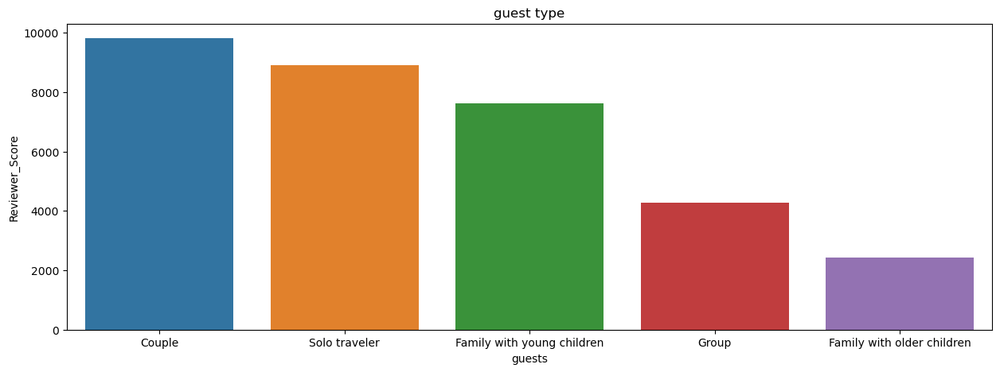

In [71]:
plt.figure(figsize=(15,5))
sns.barplot(data=df3,x='guests',y='Reviewer_Score')
plt.title('guest type')
plt.show()

In [65]:
# plotly chart
fig = px.bar(df3, y='Reviewer_Score', x='guests', text_auto='.2s',labels={'guests': 'guests', 'Reviewer_Score':'Count'},title="Guest types")
fig.show()

• About the Arab guests
we have 20 different nationalities, their number reaches more than 36 thousand assessments, most of them are from the Arab Gulf region, and in order, the Emirates, then Saudi Arabia, then Kuwait and then Qatar.

• As for the countries, the most destinations were the United Kingdom, then France and Spain.

• Average number of nights stay 3 nights.

• The rating is from 7.5 to 9.5 Emiratis are the most numerous in all countries except France, the Saudis are more.


# 3- What about business trips, the average days of stay and the most reserved rooms, and do they have special requests during booking, and what are the most negative and positive reviews?¶

- 1 >>  Leisure trip 
- 2 >>  Business trip

In [72]:
b_trip=df[['Reviewer_Score','trip_type','Region_of_Reviewer','Reviewer_Nationality','Hotel_Name','Country_of_Hotel','negative_review','positive','type_of_Room','guests','stayed','Tourist']]
b_trip.head(2)

,Reviewer_Score,trip_type,Region_of_Reviewer,Reviewer_Nationality,Hotel_Name,Country_of_Hotel,negative_review,positive,type_of_Room,guests,stayed,Tourist
0,7.5,1.0,Europe,Ireland,Hotel Arena,Netherlands,negative,real complaint hotel great great location surr...,Duplex Double Room,Couple,4,1
1,7.1,1.0,Oceania,Australia,Hotel Arena,Netherlands,room nice elderly bit difficult room two story...,location good staff ok cute hotel breakfast ra...,Duplex Double Room,Family with young children,3,1


In [73]:
b_trip = b_trip[b_trip['trip_type']==2.0]
b_trip.head()

,Reviewer_Score,trip_type,Region_of_Reviewer,Reviewer_Nationality,Hotel_Name,Country_of_Hotel,negative_review,positive,type_of_Room,guests,stayed,Tourist
9,5.8,2.0,Europe,France,Hotel Arena,Netherlands,started big noise worker loading wood window s...,style location room,Duplex Twin Room,Solo traveler,1,1
11,9.2,2.0,Europe,Italy,Hotel Arena,Netherlands,negative,hotel renovated great care appreciation unique...,Duplex Double Room,Solo traveler,1,1
16,7.1,2.0,Europe,Netherlands,Hotel Arena,Netherlands,negative,public area lovely room nice window broken dra...,Duplex Double Room,Group,2,0
24,8.3,2.0,Europe,France,Hotel Arena,Netherlands,careful still renovating building start suit b...,great hotel original concept style,Duplex Twin Room,Solo traveler,2,1
32,7.1,2.0,Europe,Ireland,Hotel Arena,Netherlands,cleaned well lady pushing pay breakfast poor s...,building meeting room modern style room park,Duplex Double Room,Group,1,1


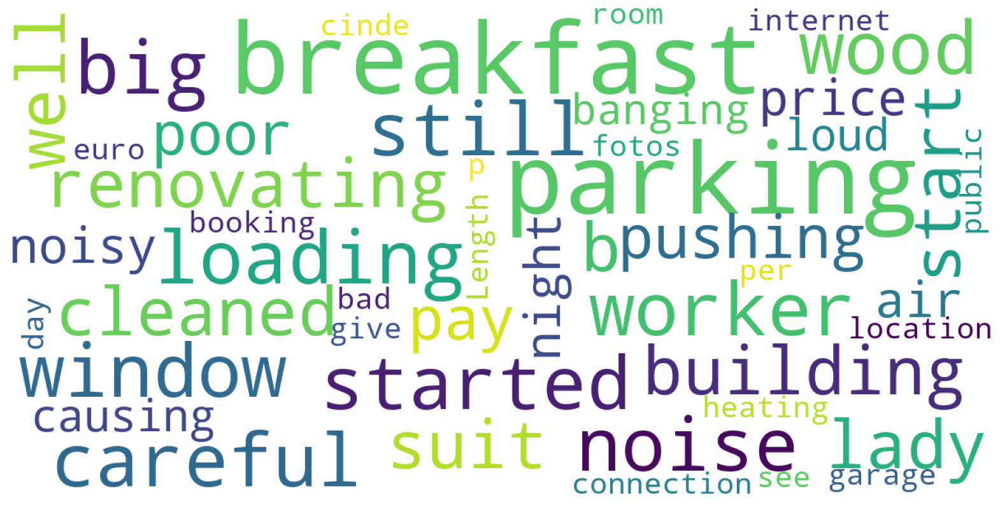

In [74]:
show_wordcloud(b_trip["negative_review"])

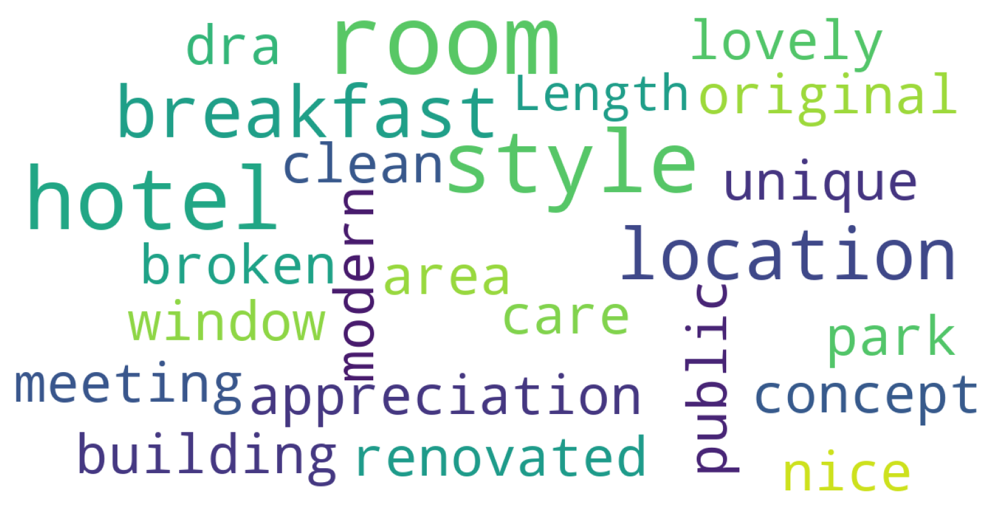

In [75]:
show_wordcloud(b_trip["positive"])

In [76]:
b_trip["Tourist"].value_counts(normalize=True)[:11]

1    0.671401
0    0.328599
Name: Tourist, dtype: float64

In [77]:
b_trip["Reviewer_Nationality"].value_counts()& (b_trip["Tourist"] == 0).sum()


United Kingdom              25672
United States of America     1032
Netherlands                    64
Germany                      1376
Italy                        1376
                            ...  
Gambia                          0
Bhutan                          0
Afghanistan                     0
Saint Martin                    0
Djibouti                        0
Name: Reviewer_Nationality, Length: 199, dtype: int64

In [78]:
df4=b_trip[b_trip['Tourist']==0] 
df4['Reviewer_Nationality'].value_counts()

United Kingdom    23754
France              587
Italy               567
Netherlands         459
Spain               322
Austria             271
Name: Reviewer_Nationality, dtype: int64

In [79]:
df5=b_trip[b_trip['Tourist']==1] 
df5['Reviewer_Nationality'].value_counts()

United Kingdom              6526
United States of America    3723
Netherlands                 2181
Germany                     2037
Ireland                     1878
                            ... 
Gambia                         1
Bhutan                         1
Afghanistan                    1
Saint Martin                   1
Djibouti                       1
Name: Reviewer_Nationality, Length: 199, dtype: int64

• We have more than 80,000 guests for business

• Duration of stay from one night to 3 nights, the most frequent one is one night.

• There is no preference for room types, but most are Double Room.

• Most of the negative comments talked about noise and workers

• Positive comments were about admiring the style of the hotel, the design of the building, the room decor, and the breakfast.

• About 30% of business guest data from the same country as the hotel and most of them are from the UK.

# 4- What about the type of guests, whether single or couple, what are the most important points that make them happy with the experience, and also what are the most important requests of those who have pets?

In [80]:
df_guests=df[['Reviewer_Score','trip_type','Region_of_Reviewer','Reviewer_Nationality','Hotel_Name','Country_of_Hotel','negative_review','positive','type_of_Room','guests','stayed','Tourist','with_a_pet']]

In [81]:
df_guests.head(2)

,Reviewer_Score,trip_type,Region_of_Reviewer,Reviewer_Nationality,Hotel_Name,Country_of_Hotel,negative_review,positive,type_of_Room,guests,stayed,Tourist,with_a_pet
0,7.5,1.0,Europe,Ireland,Hotel Arena,Netherlands,negative,real complaint hotel great great location surr...,Duplex Double Room,Couple,4,1,0
1,7.1,1.0,Oceania,Australia,Hotel Arena,Netherlands,room nice elderly bit difficult room two story...,location good staff ok cute hotel breakfast ra...,Duplex Double Room,Family with young children,3,1,0


In [82]:
df_guests.guests.value_counts()

Couple                        241662
Solo traveler                 100698
Group                          61965
Family with young children     57451
Family with older children     25156
Travelers with friends          2001
Name: guests, dtype: int64

In [83]:
px.bar(data_frame=df_guests,x=df_guests.guests.value_counts().index,y=df_guests.guests.value_counts().values)

In [84]:
df_couple=df_guests[df_guests['guests']=='Couple']
df_solo=df_guests[df_guests['guests']=='Solo traveler']
df_with_pet=df_guests[df_guests.with_a_pet == 1]

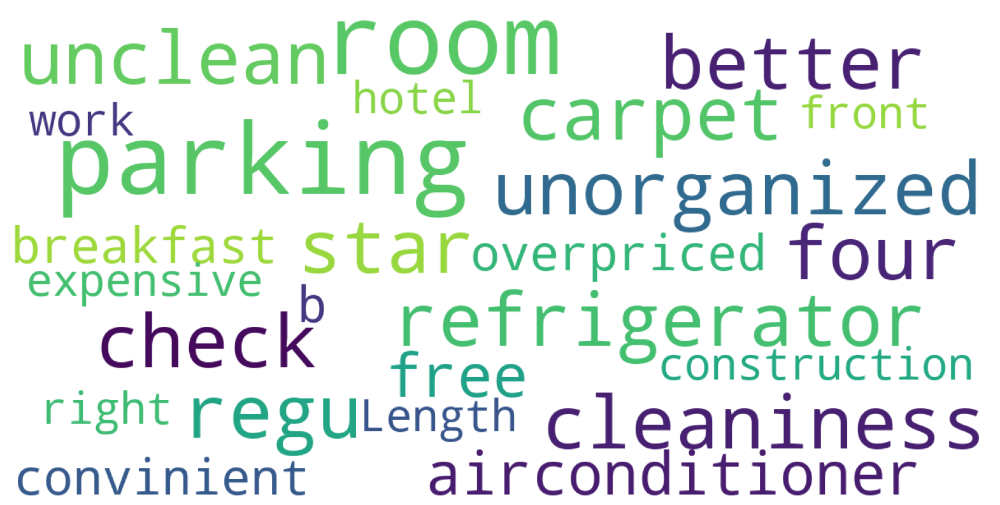

In [85]:
show_wordcloud(df_with_pet["negative_review"])

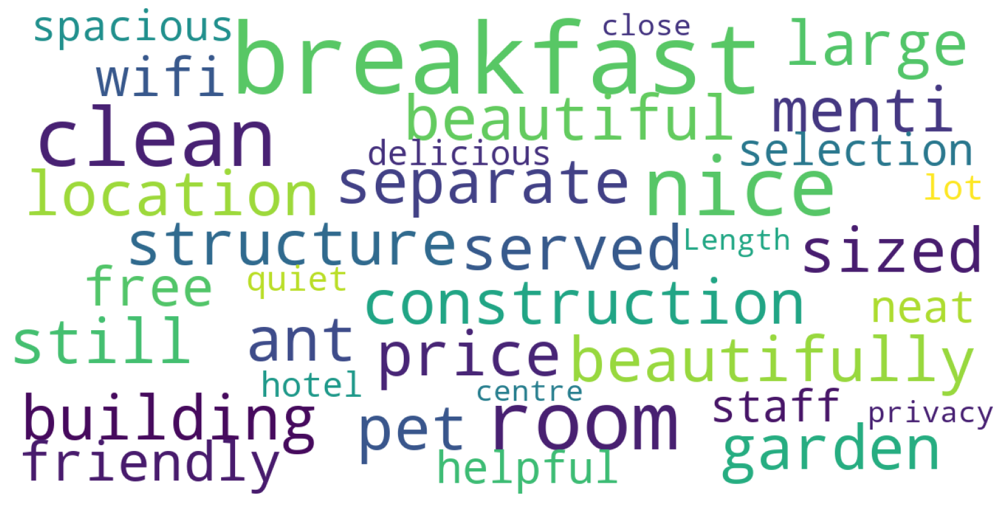

In [86]:
show_wordcloud(df_with_pet["positive"])

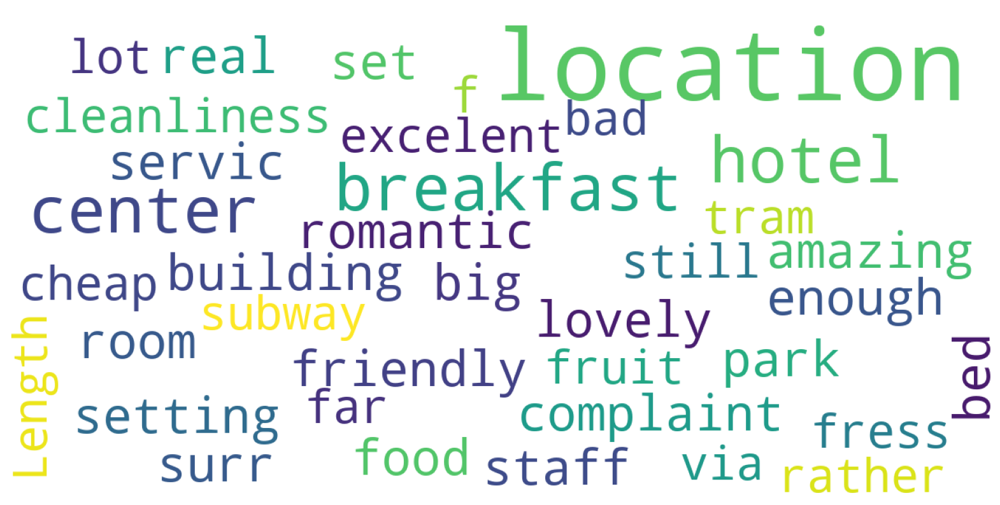

In [87]:
show_wordcloud(df_couple["positive"])

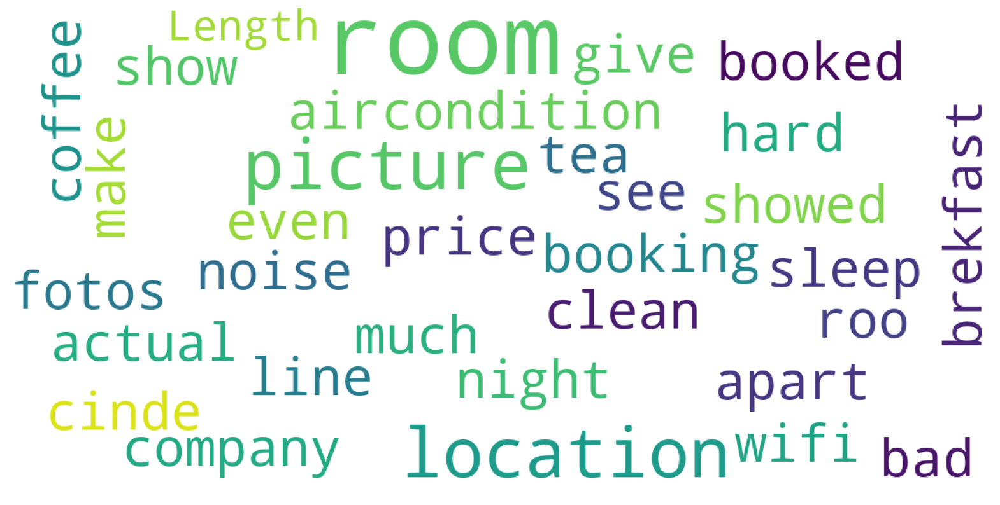

In [88]:
show_wordcloud(df_couple["negative_review"])

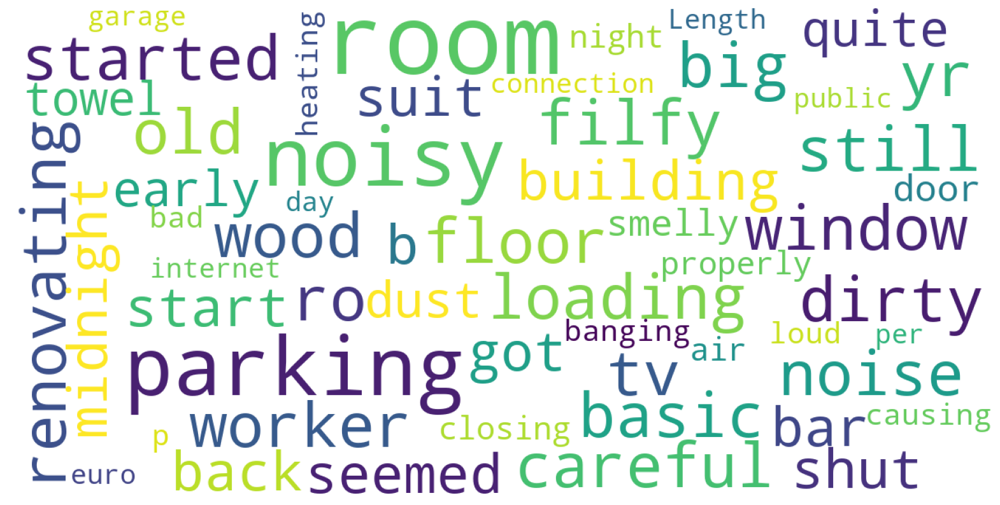

In [89]:
show_wordcloud(df_solo["negative_review"])

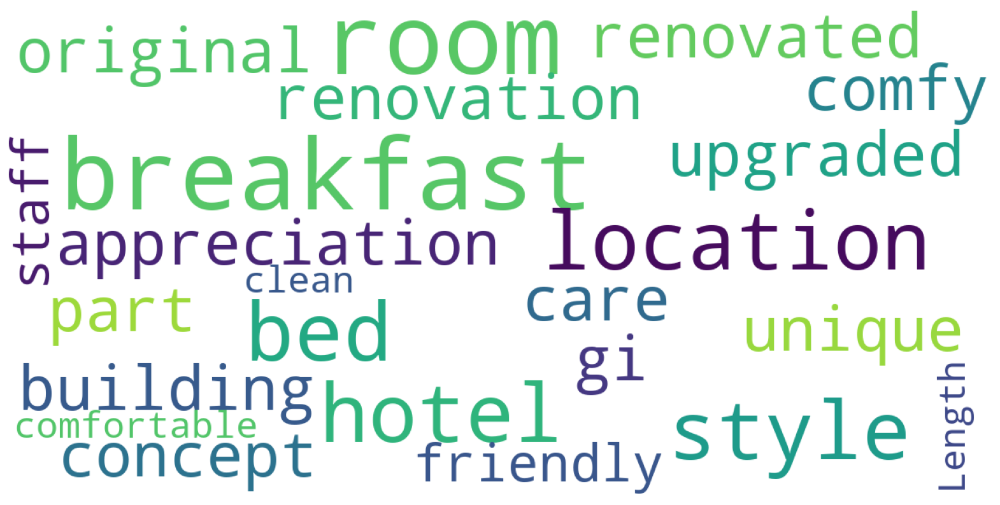

In [90]:
show_wordcloud(df_solo["positive"])

• With pets they were happy because of the breakfast, the building, room service and the gardens and spa.

• With pets they were unhappy because of the carpets, the parking, over price, cleanliness.

• Most of the guests are couples or with family, and couples are 50% of the data.

• The couples were not satisfied with the breakfast, tea, and coffee services, and many of them talked about the Wi-Fi service and the rooms, and some mentioned that the pictures of the hotel were not the truth.

• But the couples were satisfied with the location of the hotel, the cheap price, and the location outside the hotel, and romantic.

• As for solo guests, the negative comments were more than positive. The negatives were noise, bad smell, uncleanliness, and parking.

• As for the positive, the location was breakfast and the room.

• There are no special requests for with pets.

# 5- What is the ratio of tourists to non-tourists in the data?¶

In [91]:
df["Tourist"].value_counts(normalize=True)

1    0.655484
0    0.344516
Name: Tourist, dtype: float64

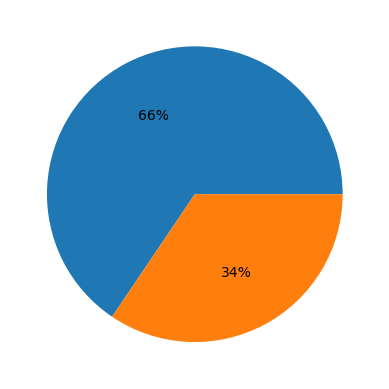

In [98]:
plt.pie(df['Tourist'].value_counts().values,autopct='%.0f%%')
plt.show()

In [92]:
# plotly chart
px.pie(df,names='Tourist')

Through the tourist column, the data filtered, whereby a person who has a nationality and wrote a review of a hotel in the same country is not a tourist, and if otherwise, he is a tourist, in the data We have 34.5% are non-tourists and 65.5% are tourists.